# StyleGAN Exercise


1. Create an interpolation for more than 2 faces (seeds) in the same animation. Make a transition from truncation = 1 to truncation = 0  (10 steps)

2. Test with *sneakers* custom model. Make a truncation transition using this model too

 * Sneakers model - https://drive.google.com/file/d/1ReK9P4dkkClvpswdSuew35xCx2xjVsQa/view

(tip to save time: you can also download the model directly in Colab, so there's no need to download to your machine and then upload to Colab's VM)

## Importing the libraries

In [1]:
!git clone https://github.com/NVlabs/stylegan3.git
%cd stylegan3

!pip install Ninja -q
!pip install imageio-ffmpeg -q
!pip install youtube-dl -q

import torch
import dnnlib
import legacy

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os

Cloning into 'stylegan3'...
remote: Enumerating objects: 212, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 212 (delta 0), reused 1 (delta 0), pack-reused 207
Receiving objects: 100% (212/212), 4.17 MiB | 8.40 MiB/s, done.
Resolving deltas: 100% (98/98), done.
/content/stylegan3
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 57.4 MB/s eta 0:00:00


## Pre-trained model


In [2]:
base_url ='https://api.ngc.nvidia.com/v2/models/nvidia/research/stylegan3/versions/1/files/'
model = "stylegan3-r-ffhq-1024x1024.pkl"
url = base_url + model

## Build the functions

In [14]:
device = torch.device('cuda')

def load_network(url, device):
  with dnnlib.util.open_url(url) as f:
      G = legacy.load_network_pkl(f)['G_ema'].to(device)
  return G

def generate_z(G, seed):
  return np.random.RandomState(seed).randn(1, G.z_dim)

def generate_image(device, G, z, truncation_psi=1.0, noise_mode='const', class_idx=None):
  z = torch.from_numpy(z).to(device)
  label = torch.zeros([1, G.c_dim], device=device)
  img = G(z, label, truncation_psi=truncation_psi, noise_mode=noise_mode)
  img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  return Image.fromarray(img[0].cpu().numpy(), 'RGB')

def show_image(image,truncation=1):
  plt.axis('off')
  plt.imshow(image)
  plt.title('Truncation = {}'.format(truncation))
  plt.show()

## Part 1

### 1.1 - Create an interpolation for more than 2 faces

Load the network

In [4]:
G = load_network(url, device)

In [5]:
from tqdm.notebook import tqdm as log_progress

def interpolation(seeds, num_vectors, truncation=0.7):
  interpolation_images = []

  for i in range(len(seeds)-1):
    latent1 = generate_z(G, seeds[i])
    latent2 = generate_z(G, seeds[i+1])

    difference = latent2 - latent1
    step = difference / num_vectors
    current = latent1.copy()

    for j in log_progress(range(num_vectors), desc=f"Seed {seeds[i]}"):
      current = current + step
      image = generate_image(device, G, current, truncation)
      interpolation_images.append(image)
      #show_image(image)
  return interpolation_images

In [6]:
seeds = [4210, 4262, 4295, 4218, 500, 800, 5502]
num_vectors = 10

In [7]:
interpolation_images = interpolation(seeds, num_vectors, 0.5)

Seed 4210:   0%|          | 0/10 [00:00<?, ?it/s]

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "filtered_lrelu_plugin"... Done.


Seed 4262:   0%|          | 0/10 [00:00<?, ?it/s]

Seed 4295:   0%|          | 0/10 [00:00<?, ?it/s]

Seed 4218:   0%|          | 0/10 [00:00<?, ?it/s]

Seed 500:   0%|          | 0/10 [00:00<?, ?it/s]

Seed 800:   0%|          | 0/10 [00:00<?, ?it/s]

### 1.2 - Truncation transition

Seed: 500


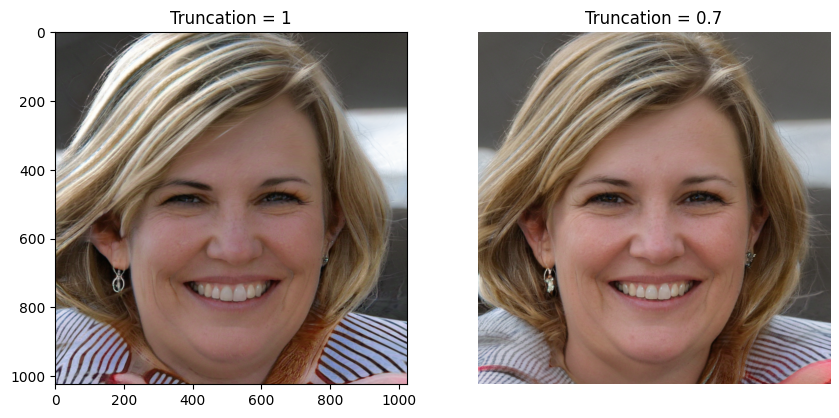

Seed: 501


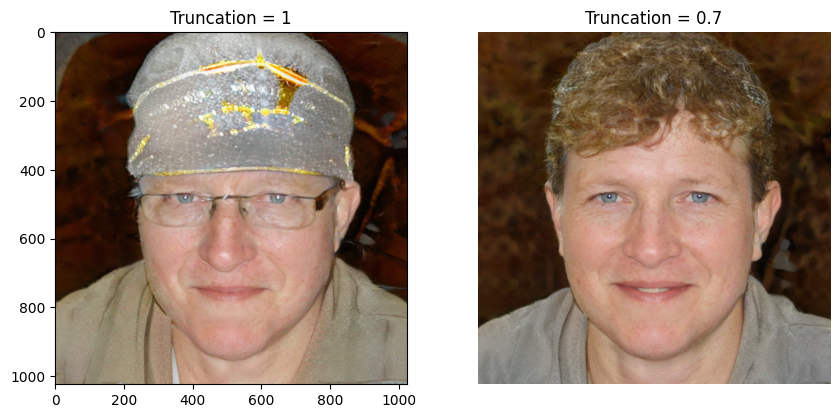

Seed: 502


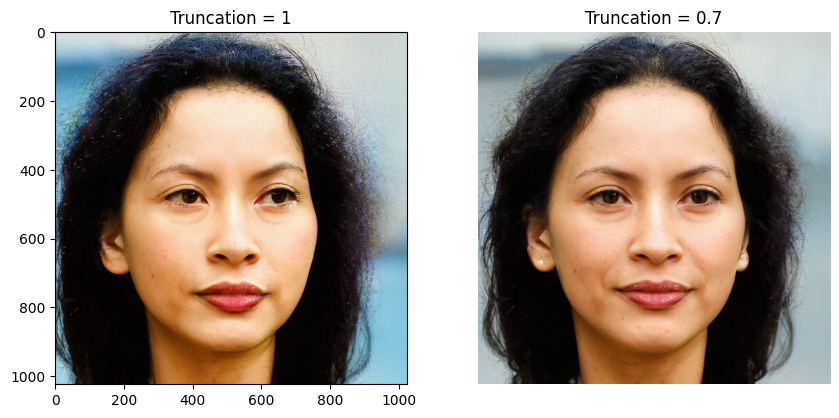

Seed: 503


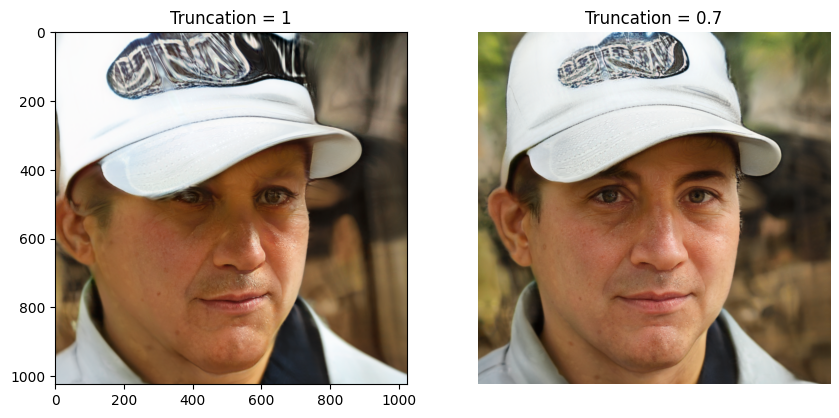

Seed: 504


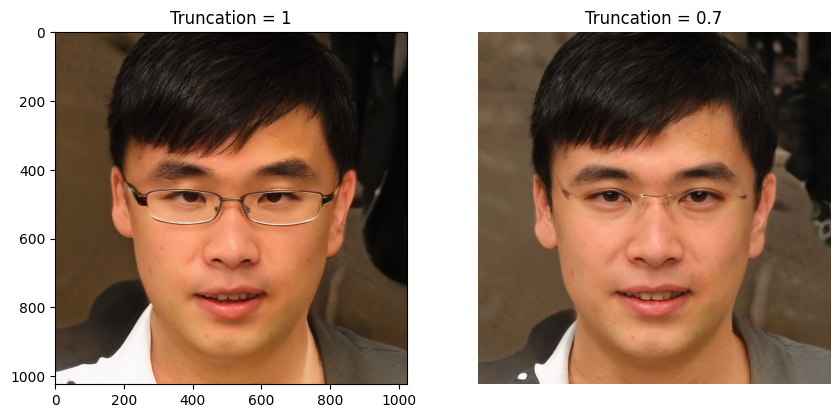

Seed: 505


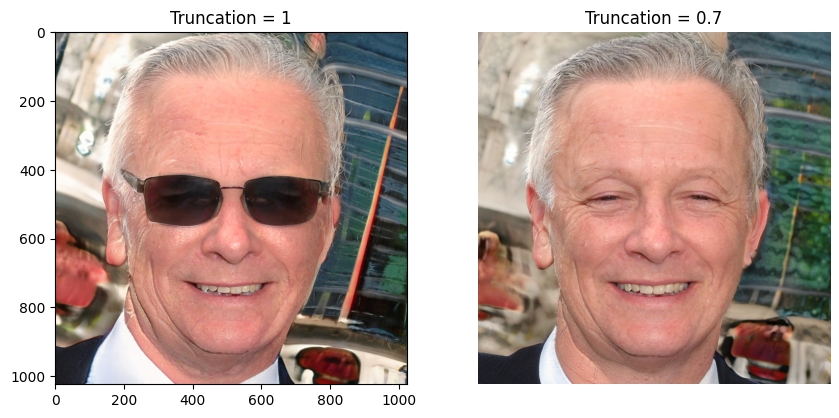

In [8]:
seed_start = 500
seed_end = 505
custom_truncation = 0.7

for s in range(seed_start, seed_end+1):
  plt.figure(figsize=(10,6))
  print(f"Seed: {s}")
  z = generate_z(G, s)

  image = generate_image(device, G, z)
  image2 = generate_image(device, G, z, custom_truncation)
  plt.subplot(1,2,1)
  plt.title('Truncation = 1')
  plt.imshow(image)

  plt.subplot(1,2,2)
  plt.title('Truncation = {}'.format(custom_truncation))
  plt.imshow(image2)

  plt.axis('off')
  plt.show()

In [10]:
import imageio
from IPython.display import Image as displayImage

def create_gif(output_file, images_interpolation):
  with imageio.get_writer(output_file, mode='I', duration=0.15) as writer:

    for i, image in enumerate(images_interpolation):
      frame_anim = np.array(image)
      frame_anim = cv2.resize(frame_anim, (300,300))
      writer.append_data(frame_anim)

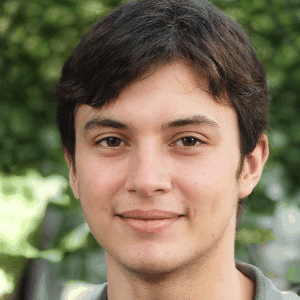

In [11]:
output_file = 'animation.gif'

create_gif(output_file, interpolation_images)
displayImage(open(output_file,'rb').read())

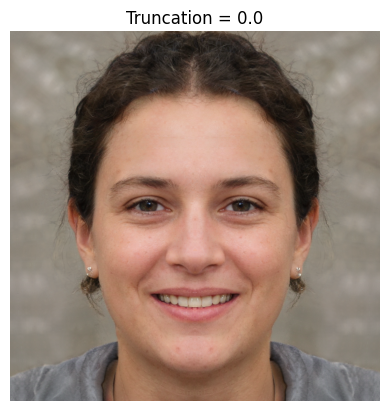

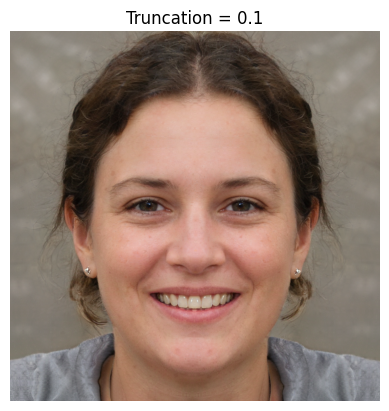

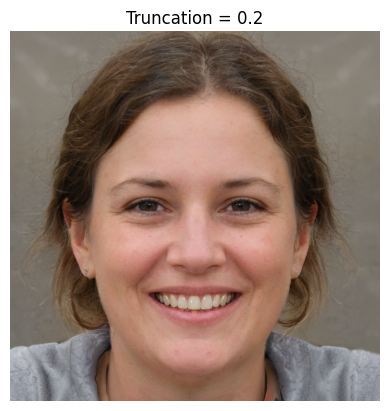

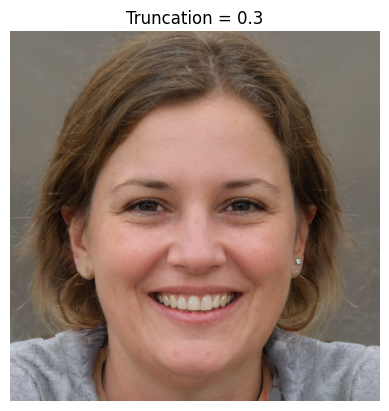

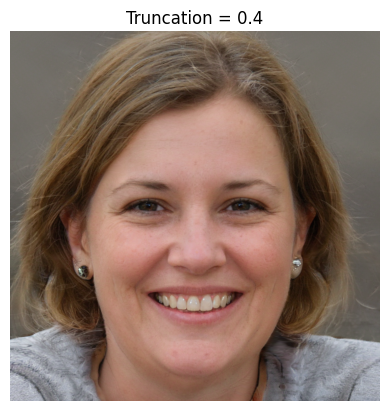

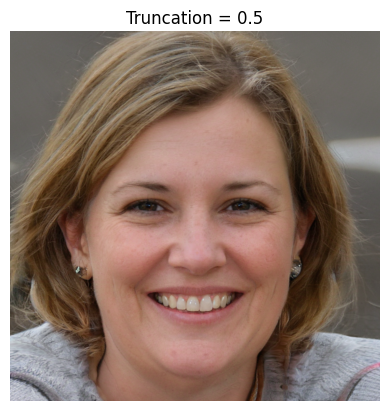

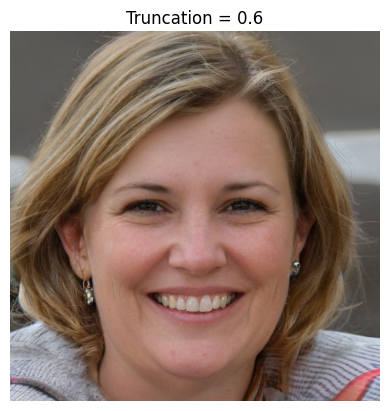

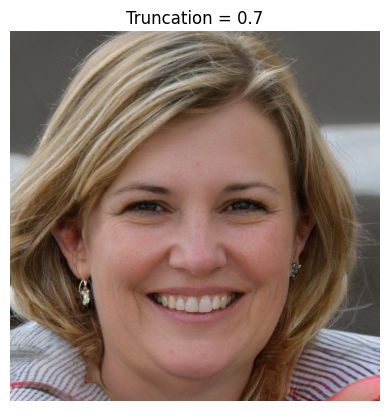

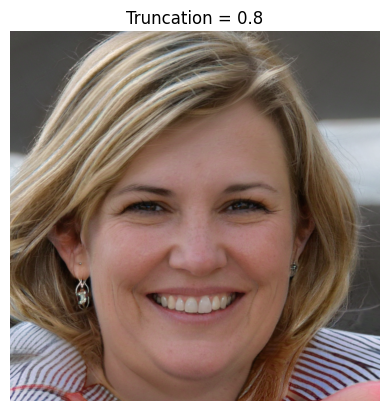

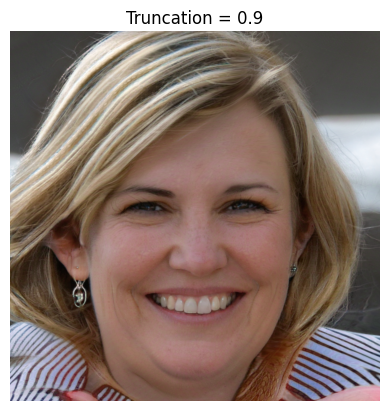

In [15]:
seed = 500

transition_images = []
#Different truncation values for same image
for t in range(0,10):
  z = generate_z(G, seed)
  truncation = t/10
  image = generate_image(device, G, z, truncation)
  show_image(image,truncation)
  transition_images.append(image)

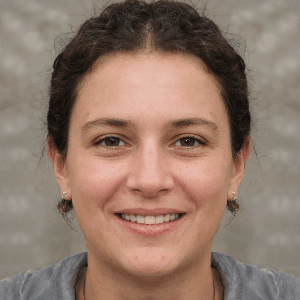

In [13]:
output_file = 'truncation_transition.gif'

create_gif(output_file, transition_images)
displayImage(open(output_file,'rb').read())

---

## Part 2

> sneakers model, trained by @stan_vossen
 * https://drive.google.com/file/d/1ReK9P4dkkClvpswdSuew35xCx2xjVsQa/view

In [17]:
if 'sneaksnap.pkl' not in os.listdir('/content/stylegan3'):
  !gdown --id 1ReK9P4dkkClvpswdSuew35xCx2xjVsQa

base_url = '/content/stylegan3/'
model = 'sneaksnap.pkl'
url = base_url + model

In [18]:
G = load_network(url, device)

### 2.1 - Create an interpolation for more than 2 seeds

Seed 4210:   0%|          | 0/10 [00:00<?, ?it/s]

Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


Seed 4262:   0%|          | 0/10 [00:00<?, ?it/s]

Seed 4295:   0%|          | 0/10 [00:00<?, ?it/s]

Seed 4218:   0%|          | 0/10 [00:00<?, ?it/s]

Seed 500:   0%|          | 0/10 [00:00<?, ?it/s]

Seed 800:   0%|          | 0/10 [00:00<?, ?it/s]

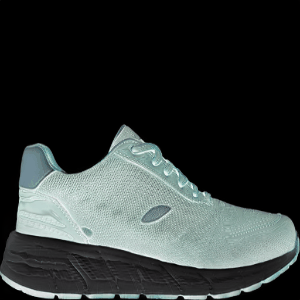

In [19]:
seeds = [4210, 4262, 4295, 4218, 500, 800, 5502]
num_vectors = 10

interpolation_images = interpolation(seeds, num_vectors, 0.5)
output_file = 'animation.gif'

create_gif(output_file, interpolation_images)
displayImage(open(output_file,'rb').read())

### 2.2 - Truncation transition

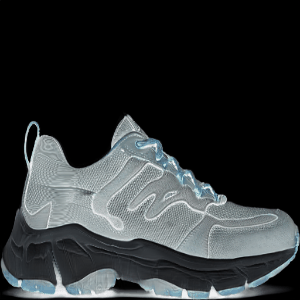

In [20]:
seed = 500

transition_images = []

for t in range(0,10):
  z = generate_z(G, seed)
  truncation = t/10
  image = generate_image(device, G, z, truncation)
  #show_image(image)
  transition_images.append(image)

output_file = 'truncation_transition.gif'

create_gif(output_file, transition_images)
displayImage(open(output_file,'rb').read())

Seed: 500


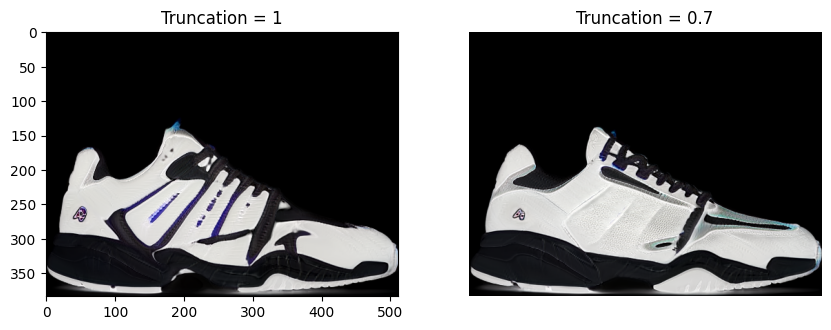

Seed: 501


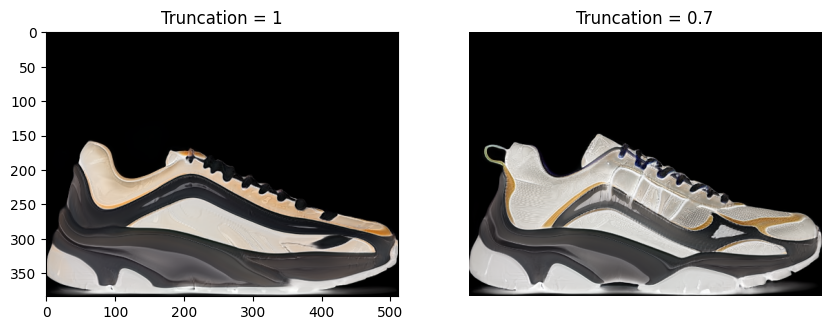

Seed: 502


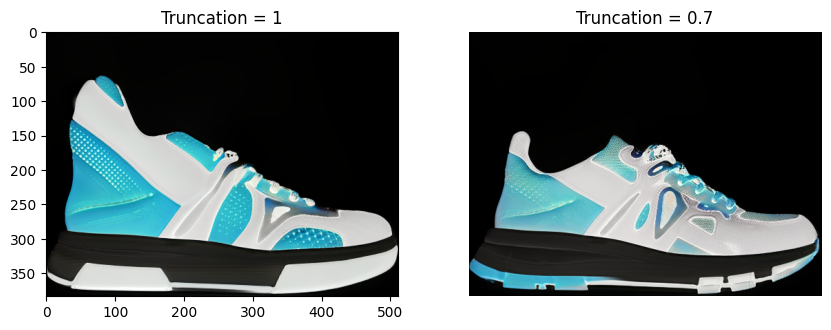

Seed: 503


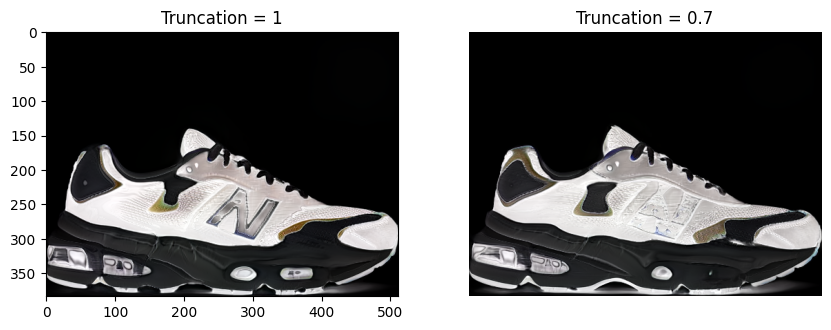

Seed: 504


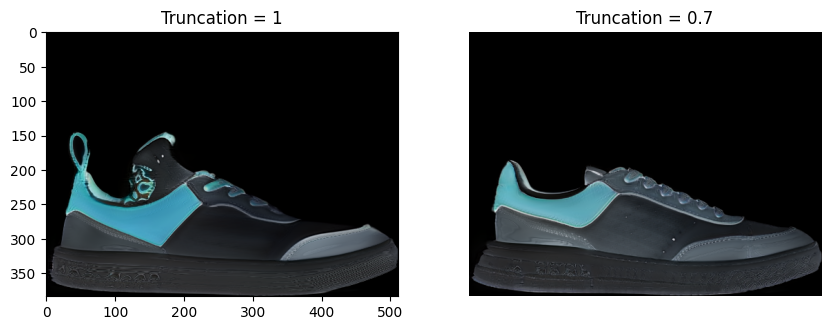

Seed: 505


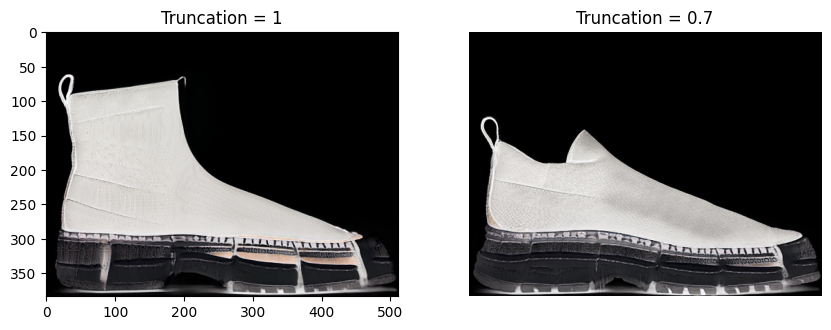

In [21]:
seed_start = 500
seed_end = 505
custom_truncation = 0.7

for s in range(seed_start, seed_end+1):
  plt.figure(figsize=(10,6))
  print(f"Seed: {s}")
  z = generate_z(G, s)

  image = generate_image(device, G, z)
  image2 = generate_image(device, G, z, custom_truncation)
  plt.subplot(1,2,1)
  plt.title('Truncation = 1')
  plt.imshow(image)

  plt.subplot(1,2,2)
  plt.title('Truncation = {}'.format(custom_truncation))
  plt.imshow(image2)

  plt.axis('off')
  plt.show()